# Objective

Introduce the Google Cloud Vision API.

# Setting up access to the API

Before you begin:
- Setup a Google Cloud account and ensure you have $300 free credit
- Create a new project on https://console.cloud.google.com
- Go to Enabled APIs on the left menu and click Enable APIs and Services. Search for and enable cloud vision API
- Create the credentials (APIs and Services > Credentials) and a service account to set up a vision API key ([Tutorial](https://codelabs.developers.google.com/codelabs/cloud-vision-api-python#0)). Download this API key to your local computer (this should be a `json` file).

Finally, ensure that the credentials JSON are uploaded to the Colab instance. The GOOGLE_APPLICATION_CREDENTIALS variable should point to this json file as highlighted in the code below. 

In the code listing below, we use an example credentials json file `msdsp462-e02889588832`. Replace this with your credentials JSON.

In [5]:
#! pip install google-cloud-vision

(You might be prompted to restart runtime after the above installation)

# Using the API

In [8]:
import os
from PIL import Image, ImageDraw, ImageFont
from IPython.display import Image as IPImage, display
import matplotlib.pyplot as plt
from google.cloud import vision

In [9]:
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = 'assignment-6-423308-3257deb4c2e2.json'

Download the example image file (people-in-a-store.jpg) from the module folder on Canvas. Upload this image to the Colab instance.

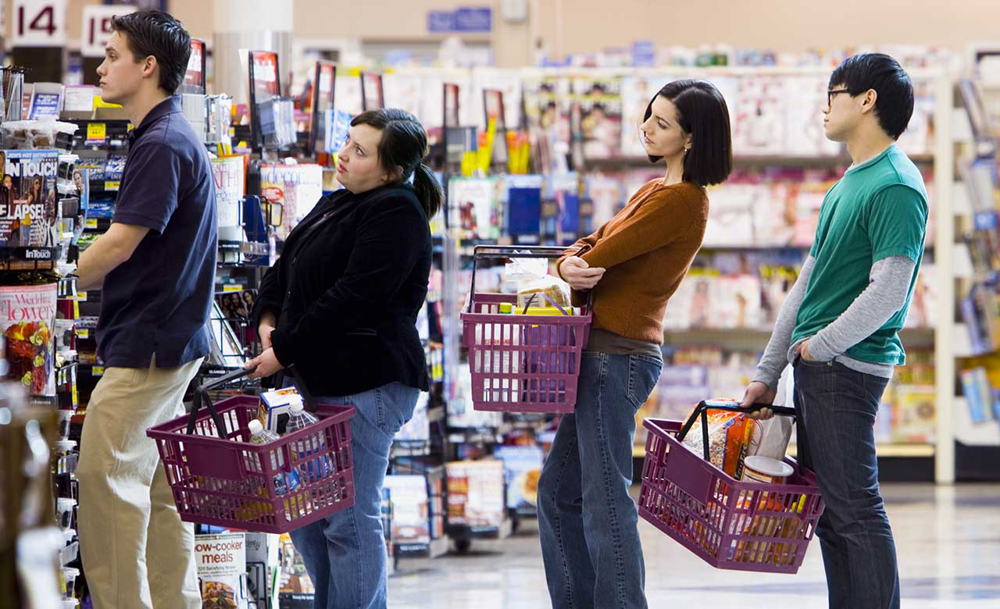

In [11]:
image_path = "people-in-a-store.jpg"
Image.open(image_path)

In [12]:
def localize_objects_and_draw(path):
    """Localize objects in the image and draw bounding boxes with custom styles."""
    client = vision.ImageAnnotatorClient()

    # Read the image content
    with open(path, 'rb') as image_file:
        image_content = image_file.read()
    
    # Create Vision API image object
    image = vision.Image(content=image_content)

    # Get object localizations
    objects = client.object_localization(image=image).localized_object_annotations

    # Open the image using Pillow
    img = Image.open(path)
    draw = ImageDraw.Draw(img)

    # Load a font with larger size
    try:
        font_path = '/System/Library/Fonts/Supplemental/Arial.ttf'
        font = ImageFont.truetype(font_path, size=20)  # Use Arial font, size 20
    except IOError:
        font = ImageFont.load_default()  # Fallback to default font if Arial is not available

    print('Number of objects found:', len(objects))
    
    # Draw bounding boxes with custom styles
    for object_ in objects:
        print(f'\n{object_.name} (confidence: {object_.score})')
        print('Normalized bounding polygon vertices:')
        box = []
        for vertex in object_.bounding_poly.normalized_vertices:
            print(f' - ({vertex.x}, {vertex.y})')
            # Convert normalized coordinates to image dimensions
            box.append((vertex.x * img.width, vertex.y * img.height))
        
        # Draw the bounding box with a thicker line and a distinct color
        for i in range(len(box)):
            next_index = (i + 1) % len(box)  # Connect last vertex to the first
            draw.line([box[i], box[next_index]], fill="green", width=3)
        
        # Add a label with the object name, using the custom font
        label_position = (box[0][0], box[0][1] - 20)  # Slightly above the top-left corner
        draw.text(label_position, object_.name, fill="red", font=font)

    # Show the image
    #img.show()

    # Optionally, save the image with bounding boxes
    img.save('output_with_bounding_boxes.jpg')

# Call the function with the image path
localize_objects_and_draw(image_path)


Number of objects found: 10

Jeans (confidence: 0.8630578517913818)
Normalized bounding polygon vertices:
 - (0.53515625, 0.5546875)
 - (0.6640625, 0.5546875)
 - (0.6640625, 0.98828125)
 - (0.53515625, 0.98828125)

Top (confidence: 0.8481128811836243)
Normalized bounding polygon vertices:
 - (0.5703125, 0.28515625)
 - (0.7109375, 0.28515625)
 - (0.7109375, 0.5625)
 - (0.5703125, 0.5625)

Person (confidence: 0.8380240201950073)
Normalized bounding polygon vertices:
 - (0.52734375, 0.1337890625)
 - (0.7265625, 0.1337890625)
 - (0.7265625, 1.0)
 - (0.52734375, 1.0)

Jeans (confidence: 0.8073848485946655)
Normalized bounding polygon vertices:
 - (0.78515625, 0.57421875)
 - (0.89453125, 0.57421875)
 - (0.89453125, 0.99609375)
 - (0.78515625, 0.99609375)

Pants (confidence: 0.8018913269042969)
Normalized bounding polygon vertices:
 - (0.07568359375, 0.578125)
 - (0.203125, 0.578125)
 - (0.203125, 0.99609375)
 - (0.07568359375, 0.99609375)

Top (confidence: 0.7988030910491943)
Normalized boun

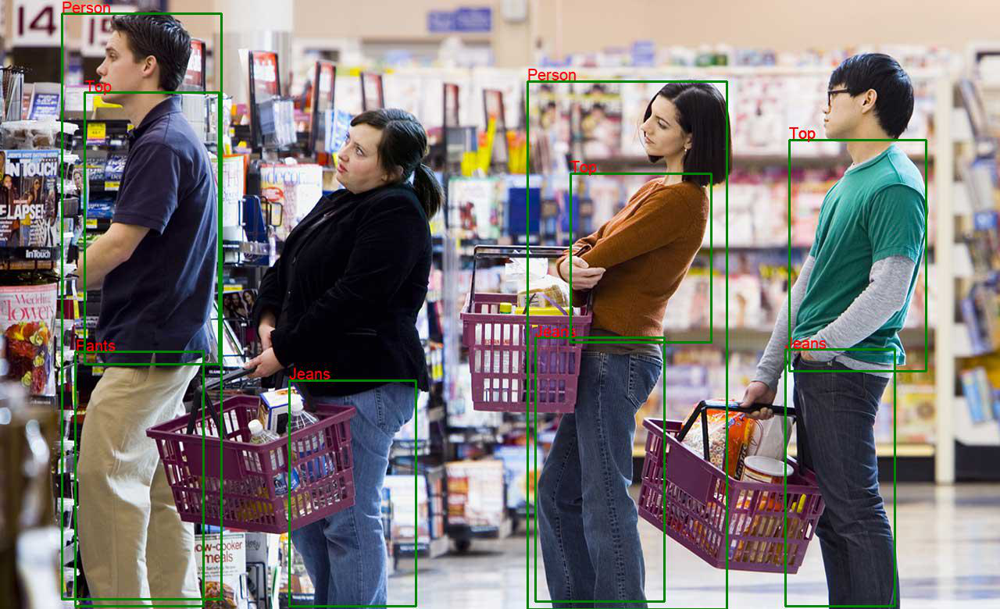

In [13]:
Image.open('output_with_bounding_boxes.jpg')

# Suggested exploration

**Task 1:** Try out the Google Cloud Vision API using the code above for five images of your own. Comment on the performance of the API. Is the object localization working as you expected? Are there any classes that are missed?

Add more code blocks as required below

### load all 6 images to view

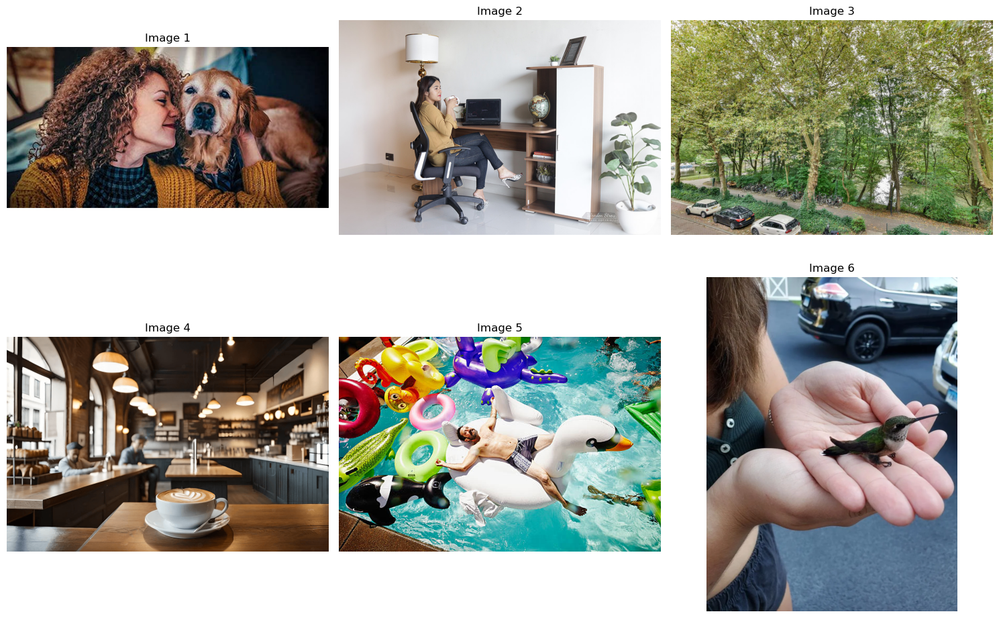

In [18]:
# Paths to the 5 images
image_paths = [
    "sample1.jpg",
    "sample2.jpg",
    "sample3.jpg",
    "sample4.png",
    "sample5.jpg",
    "sample6.jpg"
]

# Load the images
images = [Image.open(img_path) for img_path in image_paths]

# Display the images side by side
plt.figure(figsize=(15, 10))  # Adjust figure size as needed

for i, img in enumerate(images):
    plt.subplot(2, 3, i + 1)  # Create a subplot for each image
    plt.imshow(img)
    plt.axis('off')  # Turn off the axis
    plt.title(f"Image {i + 1}")  # Optional: Add titles

plt.tight_layout()
plt.show()

In [19]:
def detect_objects_and_draw_boxes_with_labels(image_paths, output_dir="output_images"):
    """
    Detects objects in multiple images, draws bounding boxes, and adds labels with object names.
    Saves the processed images to the specified output directory.
    
    Args:
    - image_paths (list): List of paths to input images.
    - output_dir (str): Directory to save the processed images.
    """

    # Initialize the Vision API client
    client = vision.ImageAnnotatorClient()

    # Create the output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for path in image_paths:
        print(f"Processing image: {path}")
        
        # Read the image content
        with open(path, 'rb') as image_file:
            content = image_file.read()

        # Create Vision API image object
        image = vision.Image(content=content)

        # Perform object localization
        response = client.object_localization(image=image)
        objects = response.localized_object_annotations

        # Open the image using Pillow
        img = Image.open(path)

        # Convert the image to RGB mode if it's not already
        if img.mode != "RGB":
            img = img.convert("RGB")

        draw = ImageDraw.Draw(img)

        # Load a font for labeling (use default PIL font if custom font is unavailable)
        try:
            font_path = '/System/Library/Fonts/Supplemental/Arial.ttf'
            font = ImageFont.truetype(font_path, 16)
        except IOError:
            font = ImageFont.load_default()

        print('Number of objects detected:', len(objects))

        for obj in objects:
            print(f"\nObject: {obj.name} (Confidence: {obj.score:.2f})")

            # Draw bounding box around the object
            vertices = [(vertex.x * img.width, vertex.y * img.height) for vertex in obj.bounding_poly.normalized_vertices]
            draw.line(vertices + [vertices[0]], fill="green", width=3)

            # Add label above the bounding box
            label = f"{obj.name} ({obj.score:.2f})"
            label_position = (vertices[0][0], max(0, vertices[0][1] - 20))  # Slightly above the top-left corner
            draw.text(label_position, label, fill="red", font=font)

            print("Bounding box vertices:")
            for vertex in vertices:
                print(f" - {vertex}")

        # Save the processed image with bounding boxes
        output_path = os.path.join(output_dir, os.path.basename(path))
        img.save(output_path)
        print(f"Saved processed image: {output_path}\n")

        # Check for errors
        if response.error.message:
            raise Exception(f'{response.error.message}')


# Call the function to process and save all images
detect_objects_and_draw_boxes_with_labels(image_paths)

Processing image: sample1.jpg
Number of objects detected: 1

Object: Dog (Confidence: 0.85)
Bounding box vertices:
 - (269.58984375, 34.0234375)
 - (530.8203125, 34.0234375)
 - (530.8203125, 268.0)
 - (269.58984375, 268.0)
Saved processed image: output_images/sample1.jpg

Processing image: sample2.jpg
Number of objects detected: 10

Object: Person (Confidence: 0.89)
Bounding box vertices:
 - (203.02734375, 154.6875)
 - (502.734375, 154.6875)
 - (502.734375, 543.75)
 - (203.02734375, 543.75)

Object: Clothing (Confidence: 0.78)
Bounding box vertices:
 - (222.36328125, 210.9375)
 - (453.515625, 210.9375)
 - (453.515625, 482.8125)
 - (222.36328125, 482.8125)

Object: Top (Confidence: 0.76)
Bounding box vertices:
 - (220.60546875, 223.828125)
 - (335.7421875, 223.828125)
 - (335.7421875, 403.125)
 - (220.60546875, 403.125)

Object: Houseplant (Confidence: 0.73)
Bounding box vertices:
 - (727.734375, 251.953125)
 - (900.0, 251.953125)
 - (900.0, 588.28125)
 - (727.734375, 588.28125)

Object

Displaying images from: output_images

Image: sample6.jpg


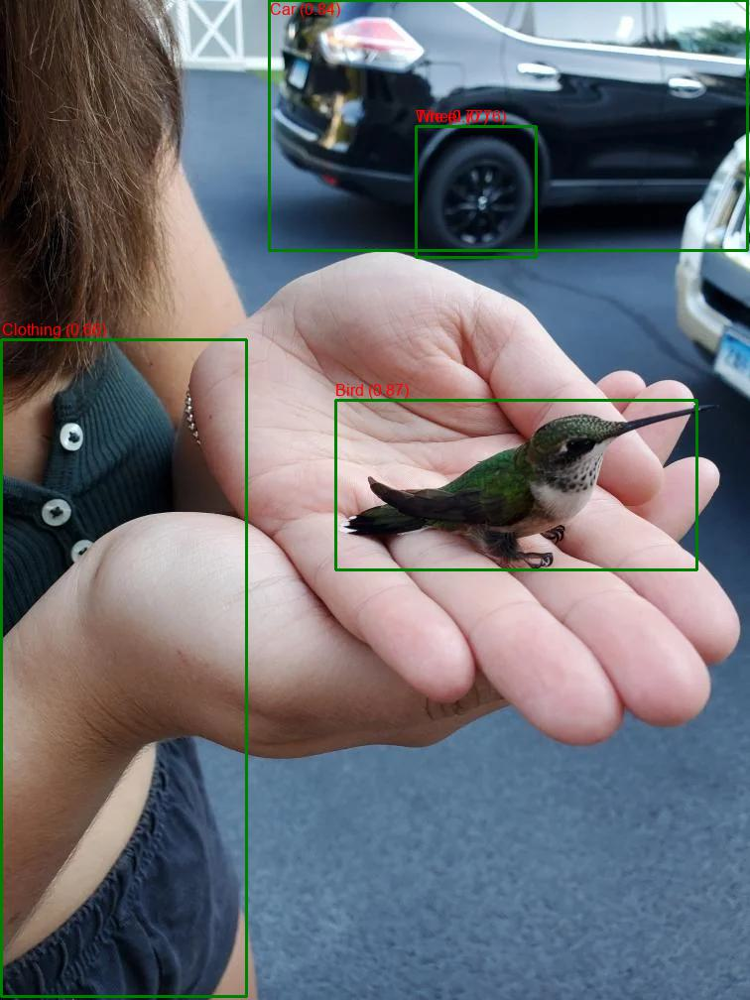

Image: sample5.jpg


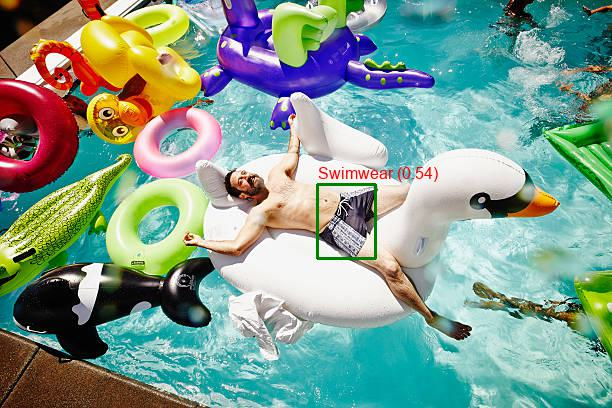

Image: sample4.png


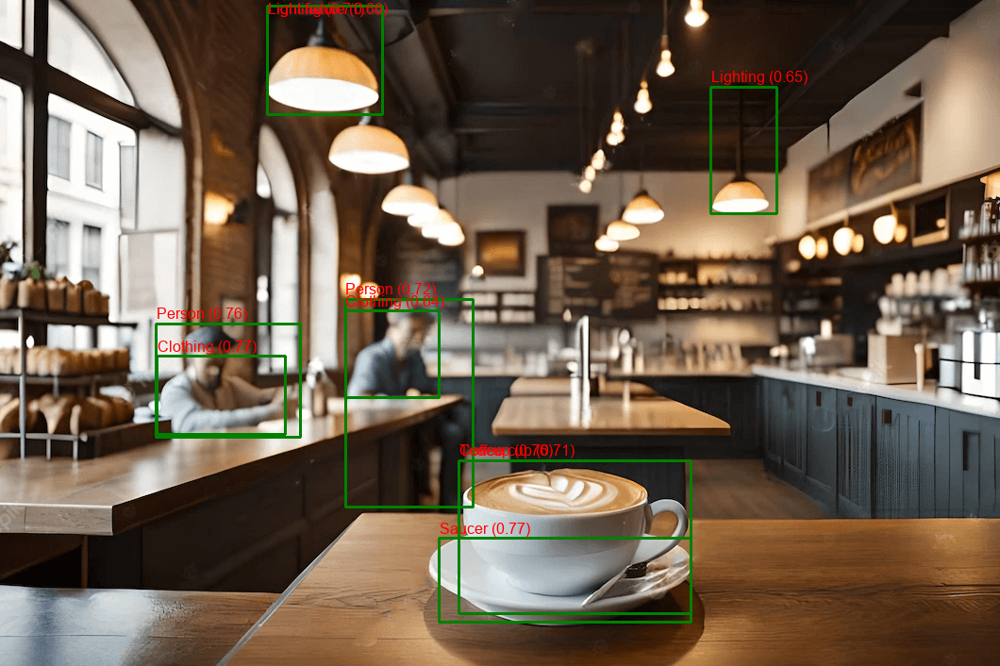

Image: sample1.jpg


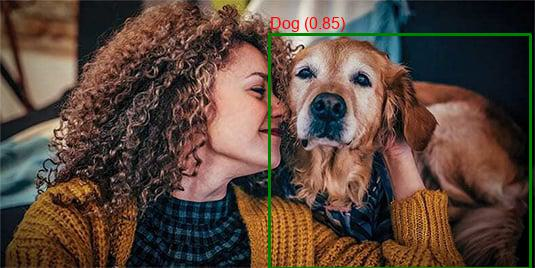

Image: sample3.jpg


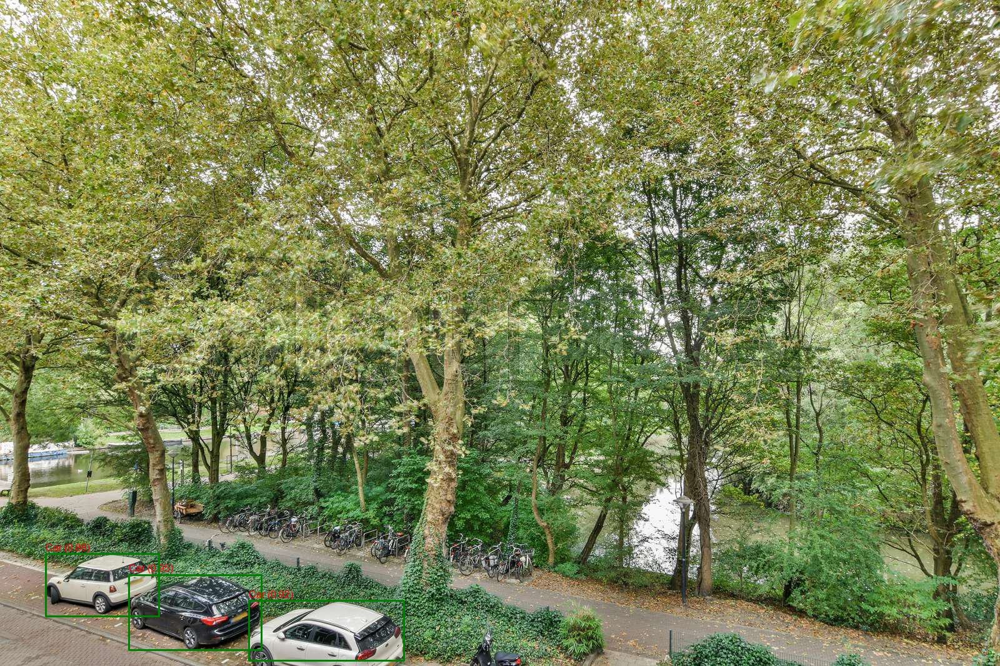

Image: sample2.jpg


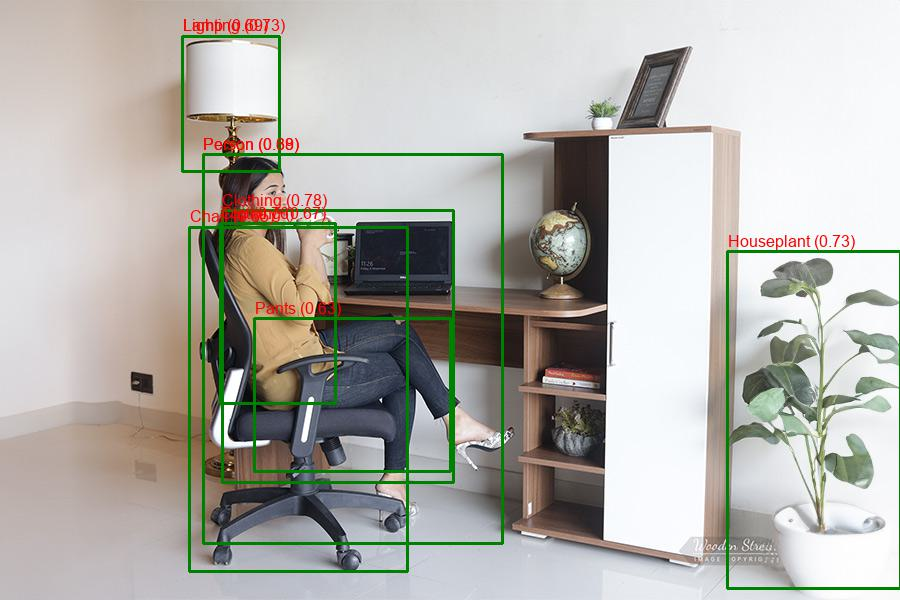

In [20]:
def display_images_from_folder(folder_path):
    """
    Display all images from a specified folder in the Jupyter Notebook cell.
    
    Args:
    - folder_path (str): Path to the folder containing the images.
    """
    print(f"Displaying images from: {folder_path}\n")
    for filename in os.listdir(folder_path):
        if filename.lower().endswith((".png", ".jpg", ".jpeg")):
            img_path = os.path.join(folder_path, filename)
            print(f"Image: {filename}")
            display(IPImage(img_path))

# Display images from the output directory
output_folder = "output_images"
display_images_from_folder(output_folder)

## Observations

<style>
  table {
    margin: auto;
    width: 100%; /* Adjust the width as needed */
  }
  td {
    text-align: justify;
    padding: 8px; /* Adding padding for better readability */
  }
  th
  {
    text-align: center;
  }
</style>

<table >
    <tr>
        <th ># </th>
        <th> Image </th>
        <th> Objects Detected </th>
        <th> Misses </th>
        <th> Confidence Levels </th>
        <th> Accuracy </th>
    </tr>
    <tr>
        <td> 1 </td>
        <td> Image 1 </td>
        <td> Dog </td>
        <td> Person </td>
        <td> High for Dog </td>
        <td> Fair </td>
    </tr>
    <tr>
        <td> 2 </td>
        <td> Image 2 </td>
        <td> Person, Chair, Cloths </td>
        <td> Laptop </td>
        <td> High for Person and Chair </td>
        <td> Excellent </td>
    </tr>
    <tr>
        <td> 3 </td>
        <td> Image 3 </td>
        <td> Car </td>
        <td> Bicycles, Trees </td>
        <td> High for Car </td>
        <td> Fair </td>
    </tr>
    <tr>
        <td> 4 </td>
        <td> Image 4 </td>
        <td> Lighting, Person, Coffee </td>
        <td> Plant </td>
        <td> High for Person/Coffee </td>
        <td> Good </td>
    </tr>
    <tr>
        <td> 5 </td>
        <td> Image 5 </td>
        <td> Swimwear </td>
        <td> Person </td>
        <td> High for Swimwear </td>
        <td> Fair </td>
    </tr>
    <tr>
        <td> 6 </td>
        <td> Image 6 </td>
        <td> Bird, Car, Clothing </td>
        <td> Person </td>
        <td> High for Bird/Car </td>
        <td> Good </td>
    </tr>
<table>

**Task 2:** Explore the documentation and try out more [applications](https://cloud.google.com/vision/docs/how-to). You should try at least one more task (beyond the object localization in Task 1)

Add more code blocks as required below

# OCR

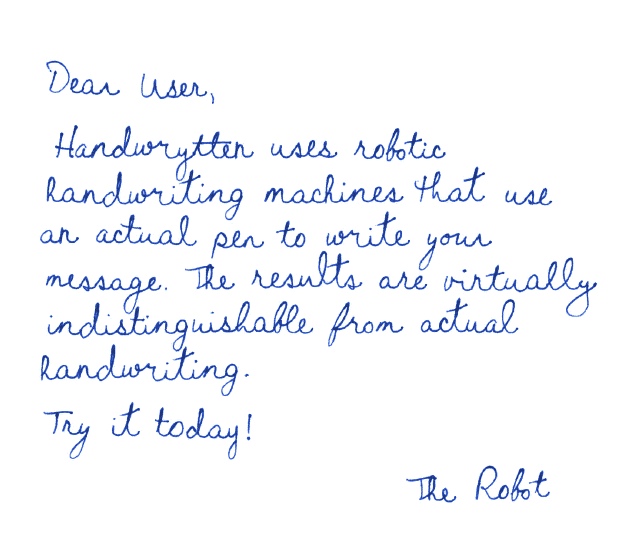

In [25]:
image_path = 'ocr_sample.png'
Image.open(image_path)

In [26]:
def detect_text(path):
    """Detects text in an image file."""
    client = vision.ImageAnnotatorClient()

    # Read the image content
    with open(path, 'rb') as image_file:
        content = image_file.read()
    
    # Create Vision API image object
    image = vision.Image(content=content)

    # Perform text detection
    response = client.text_detection(image=image)
    texts = response.text_annotations

    print('Texts:')
    for text in texts:
        print('\n"{}"'.format(text.description))
        print('\n\nBounding Poly:')
        for vertex in text.bounding_poly.vertices:
            print(' - ({}, {})'.format(vertex.x, vertex.y))
    
    # Check for errors
    if response.error.message:
        raise Exception(f'{response.error.message}')

# Call the function with the image path
detect_text(image_path)


Texts:

"Dear user,
Handwrytten uses robotic
handwriting machines that use
to write your
pen
an actual
message.
virtually
The results are
indistinguishable from actual
Randwriting.
Try it today!
The Robot"


Bounding Poly:
 - (31, 59)
 - (595, 59)
 - (595, 505)
 - (31, 505)

"Dear"


Bounding Poly:
 - (44, 60)
 - (121, 67)
 - (118, 98)
 - (41, 91)

"user"


Bounding Poly:
 - (135, 68)
 - (207, 75)
 - (204, 106)
 - (132, 99)

","


Bounding Poly:
 - (204, 75)
 - (219, 76)
 - (216, 107)
 - (201, 106)

"Handwrytten"


Bounding Poly:
 - (52, 128)
 - (252, 129)
 - (252, 166)
 - (52, 165)

"uses"


Bounding Poly:
 - (265, 130)
 - (334, 130)
 - (334, 166)
 - (265, 166)

"robotic"


Bounding Poly:
 - (352, 130)
 - (447, 130)
 - (447, 166)
 - (352, 166)

"handwriting"


Bounding Poly:
 - (41, 172)
 - (248, 172)
 - (248, 214)
 - (41, 214)

"machines"


Bounding Poly:
 - (263, 172)
 - (407, 172)
 - (407, 214)
 - (263, 214)

"that"


Bounding Poly:
 - (413, 172)
 - (489, 172)
 - (489, 214)
 - (413

# Detect Faces

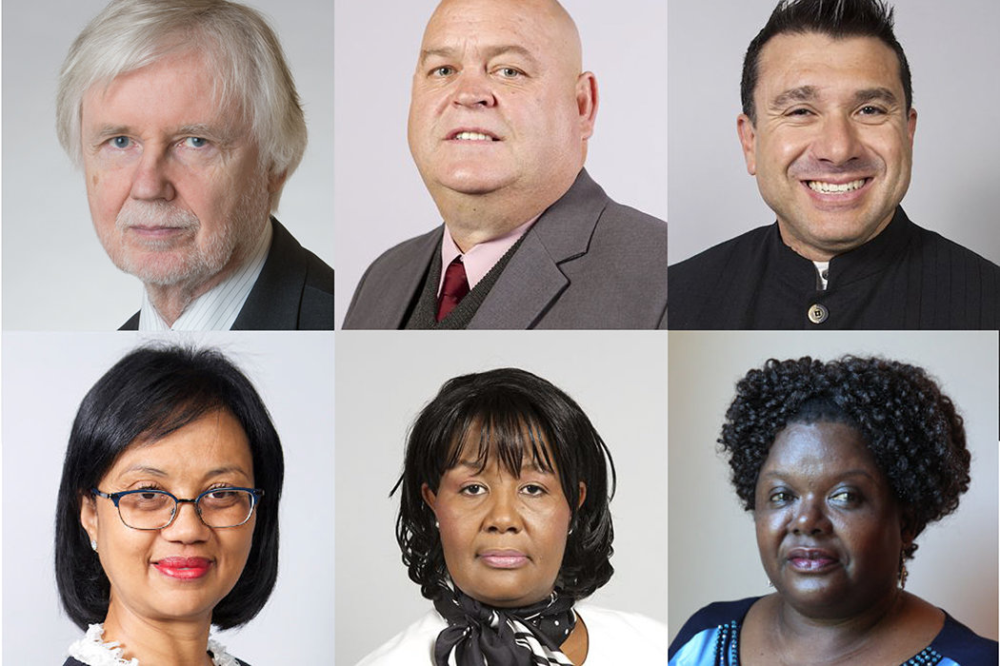

In [28]:
image_path = 'faces_sample.jpg'
Image.open(image_path)

In [29]:
def detect_faces_and_draw_boxes(path):
    """Detects faces in an image and draws bounding boxes."""
    client = vision.ImageAnnotatorClient()

    # Read the image content
    with open(path, 'rb') as image_file:
        content = image_file.read()

    # Create Vision API image object
    image = vision.Image(content=content)

    # Perform face detection
    response = client.face_detection(image=image)
    faces = response.face_annotations

    # Open the image using Pillow
    img = Image.open(path)
    draw = ImageDraw.Draw(img)

    print('Number of faces detected:', len(faces))

    for face in faces:
        print('\nFace detected with confidence:', face.detection_confidence)

        # Draw bounding box around the face
        vertices = [(vertex.x, vertex.y) for vertex in face.bounding_poly.vertices]
        draw.line(vertices + [vertices[0]], fill="blue", width=3)

        # Highlight key facial features
        facial_features = {
            "left_eye": (face.landmarks[0].position.x, face.landmarks[0].position.y),
            "right_eye": (face.landmarks[1].position.x, face.landmarks[1].position.y),
            "nose_tip": (face.landmarks[2].position.x, face.landmarks[2].position.y),
            "mouth_left": (face.landmarks[3].position.x, face.landmarks[3].position.y),
            "mouth_right": (face.landmarks[4].position.x, face.landmarks[4].position.y),
        }

        for feature, position in facial_features.items():
            draw.ellipse(
                [(position[0] - 5, position[1] - 5), (position[0] + 5, position[1] + 5)],
                fill="red",
                outline="red",
            )
            print(f" - {feature}: ({position[0]}, {position[1]})")

    # Show the image
    #img.show()

    # Optionally, save the image with bounding boxes
    img.save('output_faces_with_boxes.jpg')

    # Check for errors
    if response.error.message:
        raise Exception(f'{response.error.message}')

# Call the function with the image path
detect_faces_and_draw_boxes(image_path)


Number of faces detected: 6

Face detected with confidence: 0.9921875
 - left_eye: (841.07080078125, 118.61184692382812)
 - right_eye: (914.2862548828125, 116.69731903076172)
 - nose_tip: (815.4044799804688, 103.23483276367188)
 - mouth_left: (860.2440185546875, 101.3177719116211)
 - mouth_right: (895.8798217773438, 100.68893432617188)

Face detected with confidence: 0.95703125
 - left_eye: (126.82115173339844, 150.00633239746094)
 - right_eye: (205.27500915527344, 149.24783325195312)
 - nose_tip: (94.85519409179688, 136.3646240234375)
 - mouth_left: (142.68748474121094, 133.47763061523438)
 - mouth_right: (183.00738525390625, 132.5401611328125)

Face detected with confidence: 0.91015625
 - left_eye: (498.02508544921875, 515.1614990234375)
 - right_eye: (559.9335327148438, 515.5476684570312)
 - nose_tip: (473.6263122558594, 493.638671875)
 - mouth_left: (512.923828125, 496.2930908203125)
 - mouth_right: (542.7404174804688, 496.80767822265625)

Face detected with confidence: 0.984375
 -

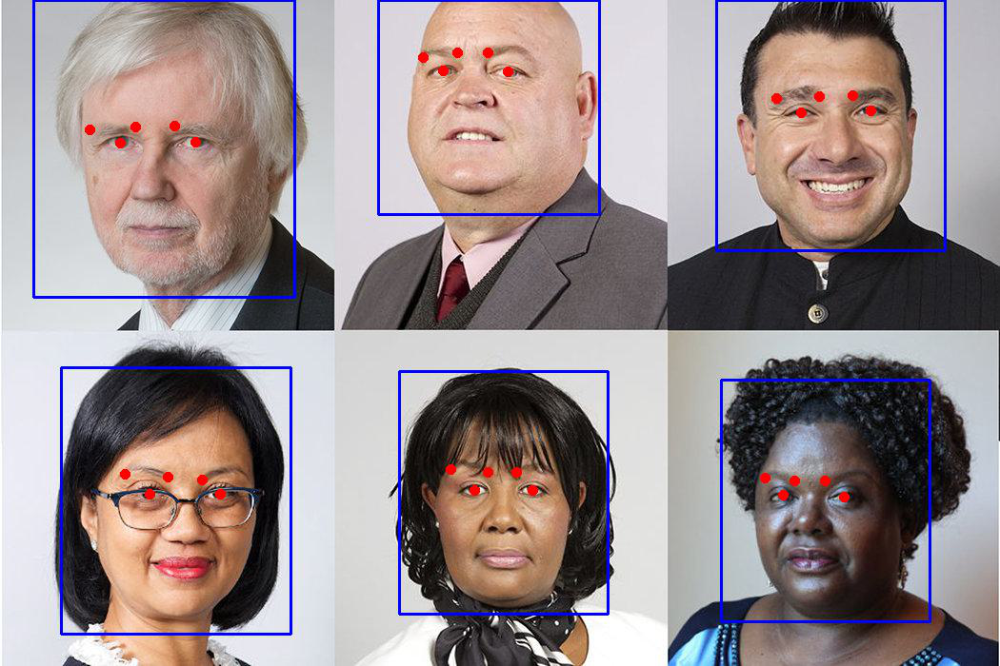

In [30]:
Image.open('output_faces_with_boxes.jpg')

# Bonus

## Discuss the pros and cons of using cloud computer vision APIs in a short written note.

<h3> Pros:</h3>

<b>Ease of Use:</b>
- Pre-trained models eliminate the need for expertise in machine learning or computer vision.
- Simple APIs make integration into applications straightforward.

<b>Cost-Effective:</b>
- Pay-as-you-go pricing allows users to pay only for the features they use, avoiding the expense of building and maintaining their own infrastructure.

<b>Scalability:</b>
- Cloud APIs handle high traffic and large-scale processing seamlessly, accommodating both small projects and enterprise needs.

<b>State-of-the-Art Models:</b>
- Cloud providers continuously update their APIs with cutting-edge technology, ensuring access to the latest advancements.
- Support for Multiple Features:
- A wide range of capabilities, such as object detection, text recognition, facial analysis, and logo detection, are available in one package.

<b>Global Accessibility:</b>
- APIs can be accessed from anywhere with an internet connection, enabling global collaboration and application deployment.

<h3>Cons:</h3>

<b>Data Privacy Concerns:</b>
- Uploading sensitive images (e.g., medical or personal data) to the cloud can pose security and compliance risks.

<b>Dependency on Internet Connectivity:</b>
- Requires a stable internet connection, which may be a limitation in remote areas or during outages.

<b>Latency Issues:</b>
- Real-time applications may suffer delays due to the round-trip processing time between the client and the cloud.

<b>Limited Customization:</b>
- Cloud APIs are generalized and may not perform as well for niche or domain-specific use cases without additional fine-tuning.

<b>Cost Over Time:</b>
- While initially cost-effective, heavy or frequent usage can become expensive compared to self-hosted solutions.

<b>Vendor Lock-In:</b>
- Relying on a specific cloud provider’s API can create dependency, making it harder to switch providers or move to an on-premise solution.